[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/guilbera/colorizing/blob/main/notebooks/pytorch_implementation/put_together_pix2pix.ipynb)

In [1]:
import os, re, torch
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np
import torchvision.utils as vutils
from torch import nn
from torchsummary import summary
from torch.utils.tensorboard import SummaryWriter
from tqdm import tqdm
from torchvision.utils import save_image
from PIL import Image
from torchvision import transforms
from skimage.color import rgb2gray
from shutil import copytree, copy

### Parameters

In [2]:
#parameters related to the images, model and training
IM_SIZE = 256
CROP_SIZE = 256
BATCH_SIZE = 64
nb_of_output_channels = 3 #for RGB, 3 - for Lab, 2
if nb_of_output_channels == 2:
  MODEL = 'Pix2Pix_Lab'
elif nb_of_output_channels == 3:
  MODEL = 'Pix2Pix_RGB'

#dataset directory
dir = '/content/drive/MyDrive/datasets/dataset_1.zip'

#directories to save logs and checkpoints to restart training
dir_summary = '/content/drive/My Drive/colorizing/'
dir_model = os.path.join(dir_summary, MODEL)
log_path = os.path.join(dir_model, 'logs')
checkpoint_dir = os.path.join(dir_model, '/chkpt_'+str(BATCH_SIZE))

#directories to save images during training
img_dir = os.path.join(dir_model, 'images_'+str(BATCH_SIZE))
img_train = os.path.join(img_dir, 'from_training')
img_test = os.path.join(img_dir, 'from_test')

### Setup

In [4]:
if 'google.colab' in str(get_ipython()):

  #mount google drive
  from google.colab import drive
  drive.mount('/content/drive')

  #copy the relevant notebooks
  !git clone https://github.com/kharanpv/CS6073_Project.git
  copy(os.path.join('/content/CS6073_Project/notebooks/utilities/pix.ipynb'), '/content/drive/MyDrive/Colab Notebooks/')
  for nbs in os.listdir('/content/CS6073_Project/notebooks/pytorch_implementation/'):
    copy(os.path.join('/content/CS6073_Project/notebooks/pytorch_implementation/', nbs), '/content/drive/MyDrive/Colab Notebooks/')

  #kora library enables using notebooks like modules
  !pip install kora -q
  from kora import drive
  drive.link_nbs()

  #copy the dataset to google drive
  if not os.path.exists('/content/drive/MyDrive/datasets/'):
    !mkdir '/content/drive/MyDrive/datasets/'
    %cd '/content/drive/My Drive/datasets/'
    !gdown --id '1hNXR_qPwNKS-z3xNQJ4fWlEWe-zES_nX'
    %cd '/content/'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
fatal: destination path 'CS6073_Project' already exists and is not an empty directory.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.7/57.7 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 76.6 MB/s eta 0:00:00
/content/drive/My Drive/datasets
/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1hNXR_qPwNKS-z3xNQJ4fWlEWe-zES_nX
From (redirected): https://drive.google.com/uc?id=1hNXR_qPwNKS-z3xNQJ4fWlEWe-zES_nX&confirm=t&uuid=24d30070-04fd-497c-9c31-55da957e431c
To: /content/drive/My Drive/datasets/dataset_1.zip
100% 479M/479M [00:12<00:00, 39.0MB/s]
/content


In [5]:
from pix import copy_dataset, rgb_to_lab, lab_to_rgb
from pix_pytorch import make_dataloaders
from pix2pix_model import Generator, Discriminator, init_weights, DiscriminatorLoss

In [6]:
if torch.cuda.is_available():
  dev = "cuda:0"
else:
  dev = "cpu"
device = torch.device(dev)

In [7]:
if not os.path.exists(dir_summary):
  os.mkdir(dir_summary)

if not os.path.exists(dir_model):
  os.mkdir(dir_model)

if not os.path.exists(log_path):
  os.mkdir(log_path)
if not os.path.exists(checkpoint_dir):
  os.mkdir(checkpoint_dir)

if not os.path.exists(img_dir):
   os.mkdir(img_dir)

if not os.path.exists(img_train):
   os.mkdir(img_train)
if not os.path.exists(img_test):
   os.mkdir(img_test)

### Prepare images

In [8]:
def lab_to_rgb_pytorch(L, ab):
  """lab_to_rgb takes a numpy stack [B, H, W ,C] as input and
     return a numpy stack in the same format"""
  L = L.permute(0, 2, 3, 1).cpu().numpy()
  ab = ab.permute(0, 2, 3, 1).detach().cpu().numpy()
  return torch.from_numpy(lab_to_rgb(L, ab)).permute(0, 3, 1, 2)

In [9]:
copy_dataset(dir)

In [11]:
generator = make_dataloaders(batch_size=BATCH_SIZE, im_size=IM_SIZE, crop_size=CROP_SIZE, split='Train', paths='/content/dataset/dataset_1/Train', n_workers=2)
track_train = make_dataloaders(batch_size=5, im_size=IM_SIZE, crop_size=CROP_SIZE, split='Test', paths='/content/dataset/dataset_1/Train', n_workers=2, shuffle=False)
track_test = make_dataloaders(batch_size=5, im_size=IM_SIZE, crop_size=CROP_SIZE, split='Test', paths='/content/dataset/dataset_1/Test', n_workers=2, shuffle=False)

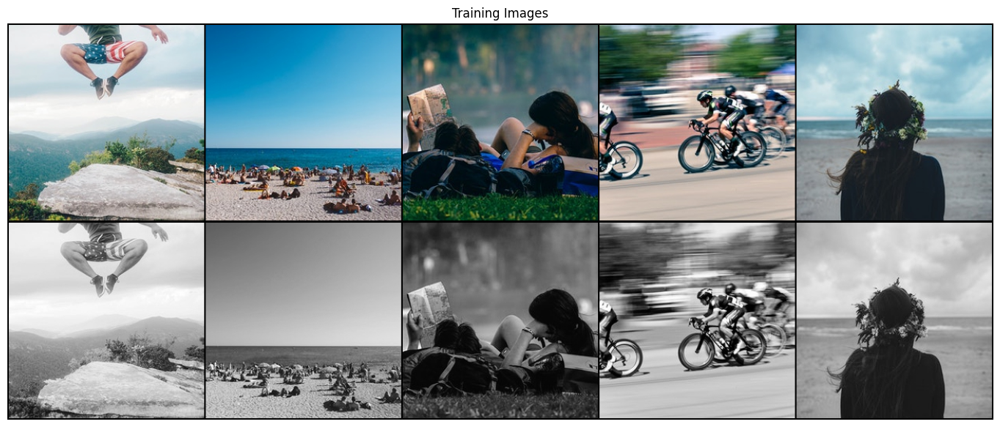

In [12]:
track_train_batch = next(iter(track_train))
color = lab_to_rgb_pytorch(track_train_batch[0]['L'], track_train_batch[0]['ab'])
color_grid = vutils.make_grid(color.to(device), padding=2, normalize=True, nrow=5).cpu()
bw_grid = vutils.make_grid(track_train_batch[0]['L'].to(device), padding=2, normalize=True, nrow=5).cpu()
fig, ax = plt.subplots(2, 1, figsize=(16, 6))
plt.tight_layout()
ax[0].set_title('Training Images')
ax[0].imshow(np.transpose(color_grid,(1,2,0)))
ax[0].set_axis_off()
ax[1].imshow(np.transpose(bw_grid,(1,2,0)))
ax[1].set_axis_off()
fig.subplots_adjust(hspace=0.)
save_image(color_grid, os.path.join(img_train, 'train_color.png'))
save_image(bw_grid, os.path.join(img_train, 'train_bw.png'))

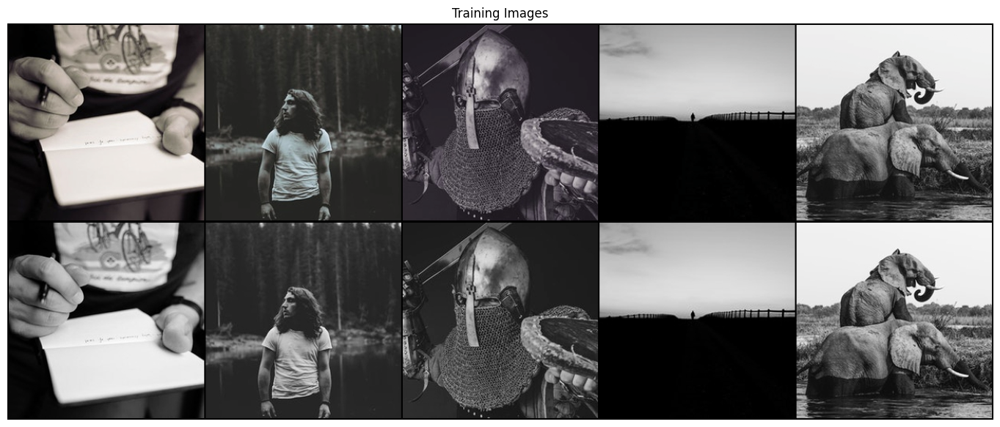

In [13]:
track_test_batch = next(iter(track_test))
color = lab_to_rgb_pytorch(track_test_batch[0]['L'], track_test_batch[0]['ab'])
color_grid = vutils.make_grid(color.to(device), padding=2, normalize=True, nrow=5).cpu()
bw_grid = vutils.make_grid(track_test_batch[0]['L'].to(device), padding=2, normalize=True, nrow=5).cpu()
fig, ax = plt.subplots(2, 1, figsize=(16, 6))
plt.tight_layout()
ax[0].set_title('Training Images')
ax[0].imshow(np.transpose(color_grid,(1,2,0)))
ax[0].set_axis_off()
ax[1].imshow(np.transpose(bw_grid,(1,2,0)))
ax[1].set_axis_off()
fig.subplots_adjust(hspace=0.)
save_image(color_grid, os.path.join(img_test, 'train_color.png'))
save_image(bw_grid, os.path.join(img_test, 'train_bw.png'))

### Set up the model

In [14]:
net_G = Generator(nb_of_output_channels).to(device)
net_D = Discriminator().to(device)

In [15]:
opt_G = optim.Adam(net_G.parameters(), lr=2e-4, betas=(0.5, 0.999))
opt_D = optim.Adam(net_D.parameters(), lr=2e-4, betas=(0.5, 0.999))

In [16]:
# load the latest model if it finds checkpoint files in the checkpoint directory
if os.listdir(checkpoint_dir):
    nums = [int(re.split('\-|\.', f)[1]) for f in os.listdir(checkpoint_dir) if f.endswith('.pth')]
    cpkt = torch.load(os.path.join(checkpoint_dir, 'cp-'+str(max(nums))+'.pth'), map_location=device)
    net_G.load_state_dict(cpkt['G_state_dict'])
    net_D.load_state_dict(cpkt['D_state_dict'])
    opt_G.load_state_dict(cpkt['optimizerG_state_dict'])
    opt_D.load_state_dict(cpkt['optimizerD_state_dict'])
    epoch = cpkt['epoch']
    loss_G = cpkt['loss_G']
    loss_D = cpkt['loss_D']
    net_G.train()
    net_D.train()
    initial_epoch = epoch+1
# otherwise it initialise the weights
else:
    net_G = net_G.apply(init_weights).train()
    net_D = net_D.apply(init_weights).train()
    initial_epoch = 0
print(initial_epoch)

0


<>:3: SyntaxWarning: invalid escape sequence '\-'
<>:3: SyntaxWarning: invalid escape sequence '\-'
/tmp/ipython-input-1931404440.py:3: SyntaxWarning: invalid escape sequence '\-'
  nums = [int(re.split('\-|\.', f)[1]) for f in os.listdir(checkpoint_dir) if f.endswith('.pth')]


## Load Model

Set path to desired model in the `\models` folder path

In [ ]:
load_model_for_further_training: bool = False

# If the user has defined a model load that model instead
if load_model_for_further_training:
    model_name: str = 'model_name.pth'
    models_dir: Path = Path('\models\{model_name}')

    # Load model and set the appropriate 
    cpkt = torch.load(models_dir, map_location=device)
    net_G.load_state_dict(cpkt['G_state_dict'])
    net_D.load_state_dict(cpkt['D_state_dict'])
    opt_G.load_state_dict(cpkt['optimizerG_state_dict'])
    opt_D.load_state_dict(cpkt['optimizerD_state_dict'])
    epoch = cpkt['epoch']
    loss_G = cpkt['loss_G']
    loss_D = cpkt['loss_D']
    net_G.train()
    net_D.train()

### Generator Loss

In [ ]:
class Pix2PixGeneratorLoss(nn.Module):
    def __init__(self, lambda_L1: float =100.0):
        # lambda_L1 is weight for L1 loss fx
        super().__init__()
        self.lambda_L1 = lambda_L1

        # Define adversarial loss function
        self.gan_loss = nn.MSELoss()

        # Define Pixel-wise Loss
        self.l1_loss = nn.L1Loss()

    def forward(self, disc_pred_fake, gen_image, target_image):
        """
        Args:
            disc_pred_fake (tensor): Output of the discriminator when fed the generated image.
            gen_image (tensor): The generated (colorized) image output by the Generator.
            target_image (tensor): The real (ground truth) color image.
        """

        # Adversarial Loss: Create a target tensor of ones matching the shape of the prediction.
        target_real = torch.ones_like(disc_pred_fake)
        loss_adv = self.gan_loss(disc_pred_fake, target_real)

        # L1 Loss: Forces the generator to match the structural details of the ground truth.
        loss_l1 = self.l1_loss(gen_image, target_image)

        # Calculate the total loss using adversarial and pixel-wise loss functions
        total_loss = loss_adv + (self.lambda_L1 * loss_l1)

        return total_loss, loss_adv, loss_l1

### Early Stop

In [ ]:
class EarlyStopping:
    def __init__(self, patience: int=10, min_delta: float=1e-4):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.best_loss = None
        self.early_stop = False

    def __call__(self, val_loss):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss > self.best_loss - self.min_delta:
            # Loss didn't improve enough
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            # Loss improved
            self.best_loss = val_loss
            self.counter = 0

### Training

about 5-6 mins on GPU

In [ ]:
# Discrimiantor Loss
GANcriterion = DiscriminatorLoss(device)

# Generator Loss 
criterion_G = Pix2PixGeneratorLoss(lambda_L1=100.0).to(device)
lambda1 = 100.
writer = SummaryWriter(log_dir=log_path)

146it [01:55,  1.26it/s]


[0,   146] loss: 14.897 0.017


146it [01:59,  1.22it/s]


[1,   146] loss: 13.030 0.000


146it [01:59,  1.22it/s]


[2,   146] loss: 12.818 0.000


146it [01:59,  1.22it/s]


[3,   146] loss: 12.693 0.000


146it [01:59,  1.22it/s]


[4,   146] loss: 12.680 0.000


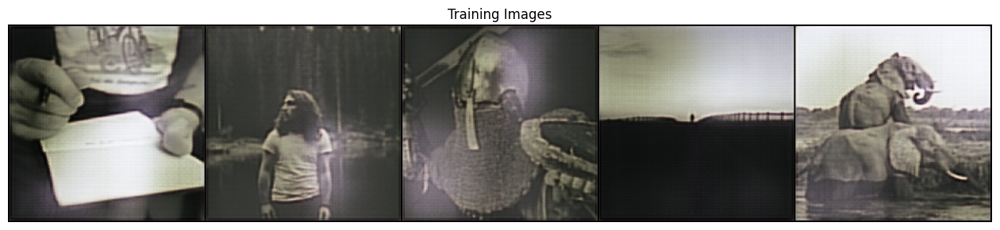

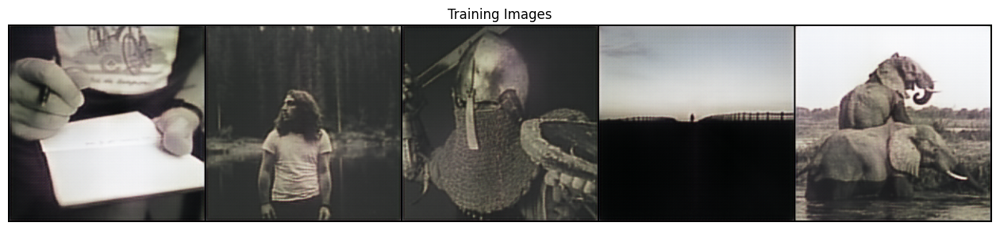

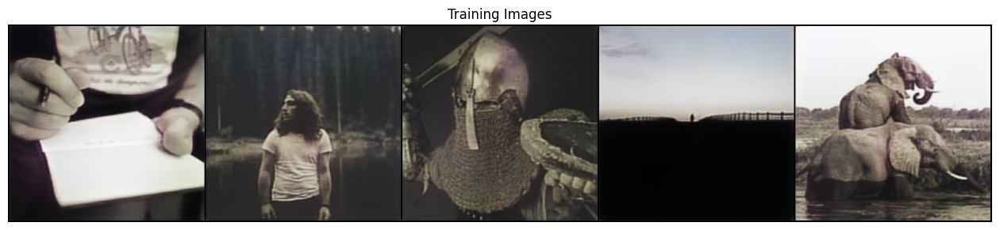

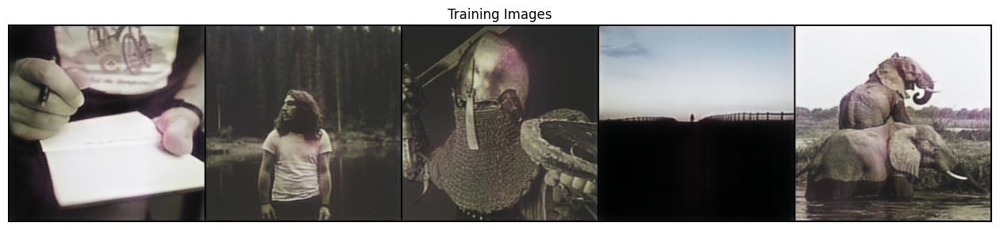

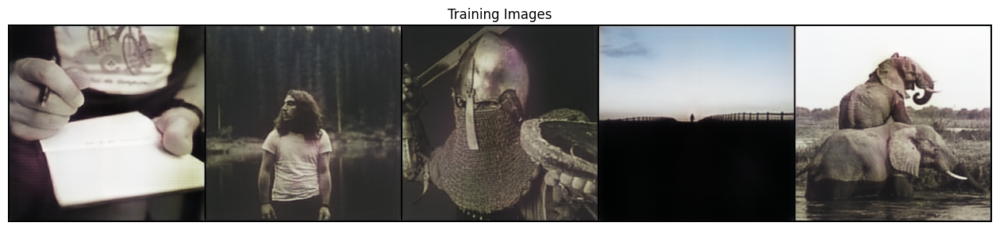

In [ ]:
early_stopper = EarlyStopping(patience=10, min_delta=0.001)
num_epochs: int = 10

# Training loop
for epoch in range(0, num_epochs):
    running_loss_D = 0.0
    running_loss_G = 0.0
    for i, data in tqdm(enumerate(generator)):
      L, ab = data[0]['L'].to(device), data[0]['ab'].to(device)
      fake_color = net_G(L)
      real_image = torch.cat([L, ab], dim=1)
      if nb_of_output_channels == 2:
        fake_image = torch.cat([L, fake_color], dim=1)
        target_image_for_G_loss = ab # Target is AB channels
      elif nb_of_output_channels == 3:
        fake_image = fake_color
        rgb = data[1].to(device)
        target_image_for_G_loss = rgb # Target is RGB image

      #train discriminator
      opt_D.zero_grad()
      #train on real images
      real_preds = net_D(real_image)
      loss_D_real = GANcriterion(real_preds, True)
      #train on fake images
      fake_preds = net_D(fake_image.detach())
      loss_D_fake = GANcriterion(fake_preds, False)
      #total loss for D
      loss_D = (loss_D_fake + loss_D_real) * 0.5
      loss_D.backward()
      opt_D.step()

      #train generator
      opt_G.zero_grad()
      #train G using GAN criterion
      fake_preds = net_D(fake_image)
      loss_G_GAN = GANcriterion(fake_preds, True)
      
      #total loss for G
      loss_G, loss_G_GAN, loss_G_L1 = criterion_G(fake_preds, fake_color, target_image_for_G_loss)
      loss_G.backward()
      opt_G.step()

      running_loss_D += loss_D.item()
      running_loss_G += loss_G.item()

    epoch_loss_D = running_loss_D/(i+1)
    epoch_loss_G = running_loss_G/(i+1)
    writer.add_scalar('loss_D', epoch_loss_D, epoch)
    writer.add_scalar('loss_G', epoch_loss_G, epoch)

    #print statistics [epoch, number of steps, loss_G, loss_D]
    print('[%d, %5d] loss: %.3f %.3f' %
                (epoch, i + 1, epoch_loss_G, epoch_loss_D))

    checkpoint_path = os.path.join(checkpoint_dir, 'cp-{}.pth'.format(epoch))
    torch.save({'epoch': epoch,
                'G_state_dict': net_G.state_dict(),
                'D_state_dict': net_D.state_dict(),
                'optimizerG_state_dict': opt_G.state_dict(),
                'optimizerD_state_dict': opt_D.state_dict(),
                'loss_G': loss_G,
                'loss_D': loss_D
                }, checkpoint_path)
    
    # Check if the Generator Loss has stopped improving
    early_stopper(epoch_loss_G)
    
    if early_stopper.early_stop:
        print(f"Early stopping triggered at epoch {epoch}!")
        break

    if nb_of_output_channels == 2:
        color_train = lab_to_rgb_pytorch(track_train_batch[0]['L'].to(device), net_G(track_train_batch[0]['L'].to(device)))
        color_test = lab_to_rgb_pytorch(track_test_batch[0]['L'].to(device), net_G(track_test_batch[0]['L'].to(device)))
    elif nb_of_output_channels == 3:
        color_train = net_G(track_train_batch[0]['L'].to(device))*255
        color_test = net_G(track_test_batch[0]['L'].to(device))*255

    color_train_grid = vutils.make_grid(color_train.to(device), padding=2, normalize=True, nrow=5).cpu()
    color_test_grid = vutils.make_grid(color_test.to(device), padding=2, normalize=True, nrow=5).cpu()

    writer.add_image('train_images', color_train_grid, epoch)
    writer.add_image('test_images', color_test_grid, epoch)

    train_path = os.path.join(img_train, 'img-{}.png'.format(epoch))
    test_path = os.path.join(img_test, 'img-{}.png'.format(epoch))
    save_image(color_train_grid, train_path)
    save_image(color_test_grid, test_path)

    plt.figure(figsize=(16,16))
    plt.axis("off")
    plt.title("Training Images")
    plt.imshow(np.transpose(color_test_grid,(1,2,0)))

writer.close()

In [ ]:
%load_ext tensorboard

In [ ]:
copytree(log_path, '/content/logs')

'/content/logs'

In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>